In [1]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from tqdm import tqdm
import time
import os
import gc
os.environ['CUDA_VISIBLE_DEVICES'] = "2"

import torch
from torch.utils.data import DataLoader
from torch.nn import MSELoss
import h5py

from scipy.signal import butter, filtfilt
from scipy.signal import correlate
from obspy.signal.invsim import cosine_taper

device = torch.device('cuda')

In [2]:
class DASDataset(torch.utils.data.Dataset):
    def __init__(self, T, X, outputs):
        'Initialization'
        self.T = torch.Tensor(T)
        self.X = torch.Tensor(X)
        self.outputs = torch.Tensor(outputs)
        
    def __len__(self):
        'Denotes the total number of samples'
        return len(self.outputs)

    def __getitem__(self, index):
        'Generates one sample of data'
        # Select sample
        t = self.T[index]
        x = self.X[index]
        y = self.outputs[index]

        return torch.concat([t, x], axis=-1), y
    
class SIREN(torch.nn.Module):
    def __init__(self, n_input, n_output, n_layers, n_units, omega):
        super().__init__()
        self.omega = omega
        self.n_layers = n_layers

        # input layer
        self.inputs = torch.nn.Linear(n_input, n_units, bias=False)
        self.inputs_bias = torch.nn.Parameter(torch.rand(n_units))

        # hidden layers
        for i in range(self.n_layers):
            setattr(self, f"ln{i+1}", torch.nn.Linear(n_units, n_units, bias=False))
            setattr(self, f"ln{i+1}_bias", torch.nn.Parameter(torch.rand(n_units)))

        # output layer
        self.outputs_bias = torch.nn.Parameter(torch.rand(n_output))
        self.outputs = torch.nn.Linear(n_units, n_output, bias=False)
        self.sigmoid = torch.nn.Sigmoid()

    def forward(self, x):
        x = torch.sin(self.omega * self.inputs(x) + self.inputs_bias)
        for i in range(self.n_layers):
            layer = getattr(self, f"ln{i+1}")
            bias = getattr(self, f"ln{i+1}_bias")
            x = torch.sin(self.omega * layer(x) + bias)
        x = 2*self.sigmoid(self.outputs(x) + self.outputs_bias) - 1

        return x

## load data

(1000, 1500) (1000, 1500) (1000, 1500)
got 1000 channel and 1500 sample: (1000, 1500)


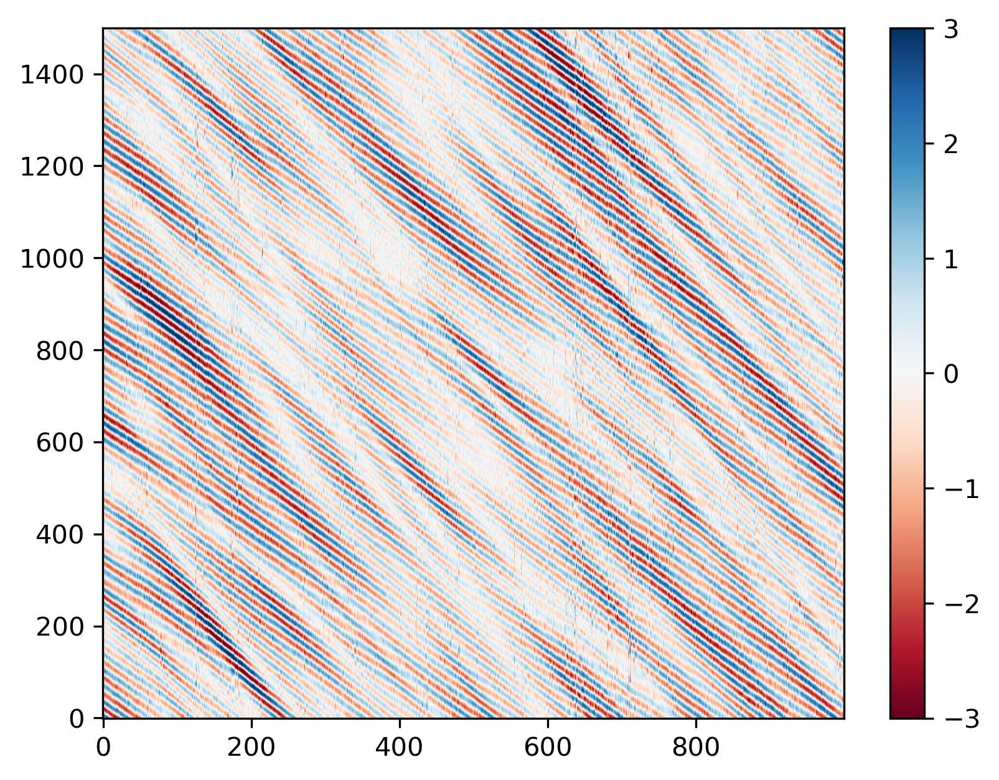

In [50]:
t_min = 0
t_max = 15000
t_dsp = 10
x_min = 4000
x_max = 5000
ff = h5py.File("../../datasets/reconstruction/continuous_test_KKFL-S_201i.h5", 'r')
data = ff['raw'][x_min:x_max, t_min:t_max:t_dsp]
reconstruct = ff['reconstruct'][x_min:x_max, t_min:t_max:t_dsp]
residual = ff['residual'][x_min:x_max, t_min:t_max:t_dsp]
ff.close()
print(data.shape, reconstruct.shape, residual.shape)

# data = df['/Acquisition/Raw[0]/RawData'][:1000, 1000:1500].T
# df.close()
vmax = 3
plt.figure(dpi=300)
plt.imshow(data.T, aspect = 'auto', cmap = 'RdBu', 
           vmax = vmax, vmin = -vmax, origin = 'lower')
plt.colorbar()

nc, ns = data.shape
print(f"got {nc} channel and {ns} sample: {data.shape}")

In [51]:
data -= np.mean(data, axis=-1, keepdims=True)
data /= np.max(np.abs(data), axis=-1, keepdims=True)

data = torch.Tensor(data.copy())

# data_bp = filtfilt(b, a, data, axis=-1)
# data_bp /= np.std(data_bp, axis=-1, keepdims=True)

in_x, in_t = torch.meshgrid(torch.arange(nc), torch.arange(ns))
T = in_t/(ns-1); X = in_x/(nc-1)
print(T.shape, X.shape)

torch.Size([1000, 1500]) torch.Size([1000, 1500])


In [52]:
d = data.reshape([-1, 1]).numpy()
index = np.abs(d) > 0.1
sum(index)/len(d)

dataset = DASDataset(T.reshape([-1, 1])[index[:, 0]].to(device), 
                     X.reshape([-1, 1])[index[:, 0]].to(device), 
                   data.reshape([-1, 1])[index[:, 0]].to(device))

data_loader = DataLoader(dataset, batch_size=1024*16, shuffle=True, num_workers=0)


dataset_val = DASDataset(T.reshape([-1, 1]).to(device), 
                         X.reshape([-1, 1]).to(device), 
                         data.reshape([-1, 1]).to(device))

data_loader = DataLoader(dataset, batch_size=4096, shuffle=True, num_workers=0)

In [53]:
n_units = 128
n_layers = 20
n_input = 2
n_output = 1
omega = 30
model = SIREN(n_input = n_input, 
              n_output = n_output, 
              n_layers = n_layers, 
              n_units = n_units, 
              omega = omega)

for name, mod in model.named_parameters():
    if "inputs" in name:     # for input layer
        if 'bias' in name:
            mod.data.uniform_(-1/np.sqrt(n_input), 1/np.sqrt(n_input))
        elif 'weight' in name:
            mod.data.uniform_(-1/2, 1/2)
    else:                    # for hidden layer
        if 'bias' in name: 
            mod.data.uniform_(-1/np.sqrt(n_units), 1/np.sqrt(n_units))
        elif 'weight' in name:
            mod.data.uniform_(-np.sqrt(6/n_units)/omega, np.sqrt(6/n_units)/omega) 
            
model.to(device);

In [54]:
nweights = 0
for name, i in model.named_parameters():
    nweights += len(i.data.flatten())
print(f"have total {nweights}")

have total 330753


## training

In [55]:
optimizer = torch.optim.Adam(model.parameters(), lr = 1e-5)
loss_fn = MSELoss()

In [56]:
nepoch = 20
train_losses = []
t0 = time.time()
for t in range(nepoch):
    model.train()
    train_loss = 0
    
    for batch_id, batch in tqdm(enumerate(data_loader), total = len(data_loader)):
        pred = model(batch[0].to(device))
        loss = loss_fn(pred, batch[1].to(device))
        
        # Backpropagation
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        train_loss += loss.item()
    
    train_loss /= len(data_loader)
    train_losses.append(train_loss)
    print(f"{t}: train loss %.8f"  % (train_loss))
    if train_loss < 1e-2:
        break
print(time.time() - t0)

100%|██████████| 283/283 [00:23<00:00, 12.19it/s]


0: train loss 0.13451497


100%|██████████| 283/283 [00:23<00:00, 12.17it/s]


1: train loss 0.05708889


100%|██████████| 283/283 [00:23<00:00, 12.00it/s]


2: train loss 0.02886947


100%|██████████| 283/283 [00:23<00:00, 11.95it/s]


3: train loss 0.02091292


100%|██████████| 283/283 [00:23<00:00, 11.99it/s]


4: train loss 0.01829734


100%|██████████| 283/283 [00:23<00:00, 12.00it/s]


5: train loss 0.01782575


100%|██████████| 283/283 [00:23<00:00, 11.86it/s]


6: train loss 0.01672055


100%|██████████| 283/283 [00:23<00:00, 12.00it/s]


7: train loss 0.01514434


100%|██████████| 283/283 [00:23<00:00, 12.01it/s]


8: train loss 0.01412495


100%|██████████| 283/283 [00:23<00:00, 12.06it/s]


9: train loss 0.01408777


100%|██████████| 283/283 [00:23<00:00, 12.02it/s]


10: train loss 0.01407809


100%|██████████| 283/283 [00:23<00:00, 12.18it/s]


11: train loss 0.01330320


100%|██████████| 283/283 [00:23<00:00, 12.16it/s]


12: train loss 0.01353834


100%|██████████| 283/283 [00:23<00:00, 12.12it/s]


13: train loss 0.01350397


100%|██████████| 283/283 [00:23<00:00, 12.10it/s]


14: train loss 0.01295326


100%|██████████| 283/283 [00:23<00:00, 12.13it/s]


15: train loss 0.01319132


100%|██████████| 283/283 [00:23<00:00, 12.13it/s]


16: train loss 0.01300229


100%|██████████| 283/283 [00:23<00:00, 12.13it/s]


17: train loss 0.01304573


100%|██████████| 283/283 [00:23<00:00, 12.09it/s]


18: train loss 0.01265015


100%|██████████| 283/283 [00:23<00:00, 12.18it/s]

19: train loss 0.01263676
468.8582241535187


In [57]:
npiece = 40
split = np.split(np.arange(len(dataset_val)), npiece)
reconstruct = np.zeros(len(dataset_val))
model.eval()

for idx in tqdm(np.arange(npiece)):
    input_tensor = dataset_val[split[idx]][0].to(device)
    reconstruct[split[idx]] = model(input_tensor).detach().cpu().numpy()[:, 0]
    
reconstruct = reconstruct.reshape(data.shape)

del input_tensor
gc.collect()
torch.cuda.empty_cache()

100%|██████████| 40/40 [00:00<00:00, 254.68it/s]


In [58]:
np.save("../../datasets/reconstruction/SIREN_test_KKFL-S_5000_6000_10min", reconstruct)

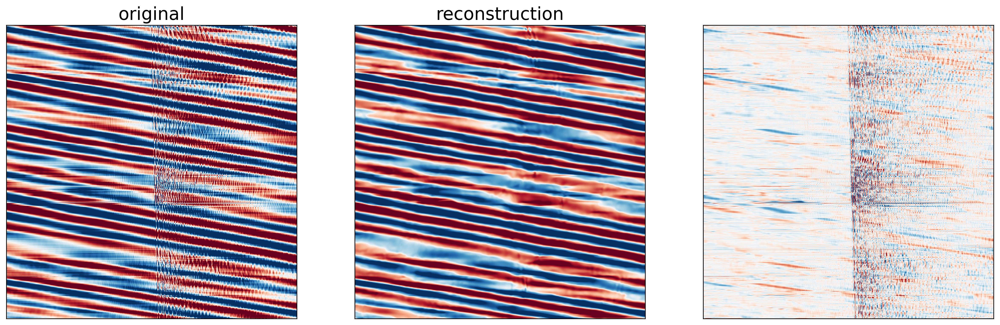

In [21]:
plt.figure(figsize = (20, 6), dpi = 300)
plt.subplot(1,3,1)
plt.imshow(data, cmap = 'RdBu', aspect = 'auto', origin='lower', 
           vmin = data.min()/2, vmax = data.max()/2)
plt.xticks([]); plt.yticks([])
plt.title("original", fontsize = 20)

plt.subplot(1,3,2)
plt.imshow(reconstruct, cmap = 'RdBu', aspect = 'auto', origin='lower', 
           vmin = data.min()/2, vmax = data.max()/2)
plt.xticks([]); plt.yticks([])
plt.title("reconstruction", fontsize = 20)

plt.subplot(1,3,3)
plt.imshow(data - reconstruct, cmap = 'RdBu', aspect = 'auto', origin='lower', 
           vmin = data.min()/2, vmax = data.max()/2)
plt.xticks([]); plt.yticks([])

# plt.subplot(2,3,4)
# plt.imshow(data_bp, cmap = 'RdBu', aspect = 'auto', origin='lower', 
#            vmin = data.min(), vmax = data.max())
# plt.xticks([]); plt.yticks([])
# plt.title("original", fontsize = 20)

# plt.subplot(2,3,5)
# plt.imshow(reconstruct_bp, cmap = 'RdBu', aspect = 'auto', origin='lower', 
#            vmin = data.min(), vmax = data.max())
# plt.xticks([]); plt.yticks([])
# plt.title("reconstruction", fontsize = 20)

# plt.subplot(2,3,6)
# plt.imshow(data_bp - reconstruct_bp, cmap = 'RdBu', aspect = 'auto', origin='lower', 
#            vmin = data.min(), vmax = data.max())
# plt.xticks([]); plt.yticks([])

plt.savefig("/home/niyiyu/siren.png", bbox_inches = 'tight', dpi=300)